# **<center><font style="color:rgb(100,109,254)">Module 10: Productionizing Computer Vision Apps</font> </center>**

<center>
    <img src='https://drive.google.com/uc?export=download&id=10u2T8uYACoh-dS_5_EyomoI14oXaGkfX' width=800> 
</center>
    

## **<font style="color:rgb(134,19,348)"> Module Outline </font>**

The module can be split into the following parts:

-  ***Lesson 1:* Analyze Faces in Images Utilizing Machine Learning Models.** *(This Tutorial)*

- *Lesson 2: Getting Started with PyQt5 Designer*

- *Lesson 3: Create a Face Analysis GUI Application Using PyQt.*

- *Lesson 4:  Convert the GUI Application into .exe.*


**Please Note**, these Jupyter Notebooks are not for sharing; do read the Copyright message below the Code License Agreement section which is in the last cell of this notebook.
-Taha Anwar

Alright, let's get started.

### **<font style="color:rgb(134,19,348)"> Import the Libraries</font>**

First, we will import the required libraries.

In [1]:
import cv2
import itertools
import numpy as np
import mediapipe as mp
import tensorflow as tf
from deepface import DeepFace
import matplotlib.pyplot as plt
from importlib.metadata import version
from previous_lesson import detectFacialLandmarks, getSize
print(f'Tensorflow verion: {tf.__version__}, it should be >= 2.3')
print(f"Mediapipe version: {version('mediapipe')}, it should be 0.8.9.1")

Directory  C:\Users\rahma /.deepface created
Directory  C:\Users\rahma /.deepface/weights created
Tensorflow verion: 2.9.1, it should be >= 2.3
Mediapipe version: 0.8.10.1, it should be 0.8.9.1


## **<font style="color:rgb(134,19,348)">Initialize the Face Detection Model</font>**

To use the Mediapipe's Face Detection solution, we first have to initialize the face detection class using the syntax **`mp.solutions.face_detection`** and then we will have to call the function **`mp.solutions.face_detection.FaceDetection()`** with the arguments explained below:

* **`model_selection`** - It is an integer index `( i.e., 0 or 1 )`. When set to `0`, a short-range model is selected that works best for faces within 2 meters from the camera, and when set to `1`, a full-range model is selected that works best for faces within 5 meters. Its default value is `0`.


* **`min_detection_confidence`** - It is the minimum detection confidence between `([0.0, 1.0])` required to consider the face-detection model's prediction successful. Its default value is `0.5` ( i.e., 50% ) which means that all the detections with prediction confidence less than `0.5` are ignored by default. 

We will also have to initialize the **`mp.solutions.drawing_utils`** class (as we have been doing in the previous lessons) to visualize the detection results on the images/frames.

In [2]:
# Initialize the mediapipe face detection class.
mp_face_detection = mp.solutions.face_detection

# Setup the face detection function by selecting the full-range model.
mp_face_detector = mp_face_detection.FaceDetection(model_selection=1, min_detection_confidence=0.4)

# Initialize the mediapipe drawing class.
mp_drawing = mp.solutions.drawing_utils

## **<font style="color:rgb(134,19,348)">Create a Face Detection Function</font>**

To analyze a face, we will first have to detect that face in an image, so now we will create a function **`detectFaces()`** in which we will use the mediapipe's face detector to perform the detection on an image/frame by passing it into the function **`mp.solutions.face_detection.FaceDetection().process()`** and get a list of a bounding box and six key points for each face in the image. The six key points are on the:

1. **Right Eye**
2. **Left Eye**
3. **Nose Tip**
4. **Mouth Center** 
5. **Right Ear Tragion** 
6. **Left Ear Tragion**

The bounding boxes are composed of `xmin` (x1) and `width` (both normalized to `[0.0, 1.0]` by the image width) and `ymin` (y1) and `height` (both normalized to `[0.0, 1.0]` by the image height). Each key point is composed of `x` and `y`, which are normalized to `[0.0, 1.0]` by the image width and height respectively.

<center><img src='https://drive.google.com/uc?export=download&id=1iWgX_Ptd4fplNJul31f3V8GiThrKCeuS' width=400><center>

The function will display the resultant image (with bounding box(es) and key points drawn) along with the original image (using the [**`matplotlib`**](https://matplotlib.org/stable/index.html) library), or return the resultant image along with the bounding box coordinates of each detected face in the image, depending upon the passed arguments.

In [11]:
def detectFaces(image, mp_face_detector, draw=True, display = True):
    '''
    This function performs face(s) detection on an image using mediapipe deep learning based face detector.
    Args:
        image:            The input image with person(s) whose face needs to be detected.
        mp_face_detector: The mediapipe's face detection function required to perform the detection.
        draw:             A boolean value that is if set to true the function draws bounding box(es) and keypoints on the output image. 
        display:          A boolean value that is if set to true the function displays the original input image, 
                          and the output image with the bounding boxes, and keypoints drawn, and also the confidence 
                          scores written (if draw is True) and returns nothing.
    Returns:
        output_image: A copy of input image with the bounding box and key points drawn and also confidence scores written.
        faces:        A list containing the bounding boxes coordinates (x1, y1, x2, y2) of the faces in the input image.
    '''
    
    # Get the height and width of the input image.
    image_height, image_width, _ = image.shape
    
    # Create a copy of the input image to draw bounding box and key points.
    output_image = image.copy()
    
    # Convert the image from BGR into RGB format.
    imgRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Perform the face detection on the image.
    results = mp_face_detector.process(imgRGB)
    
    # Initialize a list to store the bounding boxes coordinates of the detected faces.
    faces = []

    # Check if any face(s) in the image is found.
    if results.detections:

        # Iterate over the found faces.
        for face_result in results.detections:
            
            # Retrieve the bounding box coordinates of the face.
            face_bbox = face_result.location_data.relative_bounding_box
            
            # Scale back the bounding box coordinates according to the size of original input image.
            x1 = int(face_bbox.xmin * image_width)
            y1 =int(face_bbox.ymin * image_height)
            face_width = int(face_bbox.width * image_width)
            face_height = int(face_bbox.height * image_height)
            
            # Calculate the lower right corner coordinates of the bounding box.
            x2 = x1 + face_width
            y2 = y1 + face_height 
            
            # Check if the bounding boxes, and keypoints are specified to be drawn.
            if draw:

                # Draw the face bounding box and key points on the copy of the input image.
                mp_drawing.draw_detection(image=output_image, detection=face_result, 
                                          keypoint_drawing_spec=mp_drawing.DrawingSpec(color=(0,255, 255),
                                                                                       thickness=2,
                                                                                       circle_radius=image_width//115),
                                          bbox_drawing_spec=mp_drawing.DrawingSpec(color=(0,255,0),thickness=image_width//180))

                # Draw a filled rectangle near the bounding box of the face.
                # We are doing it to change the background of the confidence score to make it easily visible.
                cv2.rectangle(output_image, pt1=(x1, y1-image_width//20), pt2=(x1+image_width//12, y1) ,
                              color=(0, 255, 0), thickness=-1)

                # Write the confidence score of the face near the bounding box and on the filled rectangle. 
                cv2.putText(output_image, text=str(round(face_result.score[0], 1)), org=(x1, y1-5), 
                            fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=image_width//600, color=(255,255,255), 
                            thickness=image_width//200)

            # Increase the size of the bounding box.
            x1 = max(x1 - int(face_width/3), 0)
            y1 = max(y1 - int(face_height/3), 0)
            x2 = min(x2 + int(face_width/6), image_width)
            y2 = min(y2 + int(face_height/6), image_height)
            
            # Append the bounding box coordinates into the list.
            faces.append((x1, y1, x2, y2))  
                        
    # Check if the original input image and the output image are specified to be displayed.
    if display:
        
        # Display the original input image and the output image.
        plt.figure(figsize=[15,15])
        plt.subplot(121);plt.imshow(image[:,:,::-1]);plt.title("Original Image");plt.axis('off');
        plt.subplot(122);plt.imshow(output_image[:,:,::-1]);plt.title("Output");plt.axis('off');
        
    # Otherwise
    else:
        
        # Return the output image and the detected faces coordinates.
        return output_image, faces              

Now we will read a few sample images using the function [**`cv2.imread()`**](https://docs.opencv.org/3.4/d4/da8/group__imgcodecs.html#ga288b8b3da0892bd651fce07b3bbd3a56) and then utilize the function **`detectFaces()`** created above to perform Face Detection on a few sample images and visualize the results.

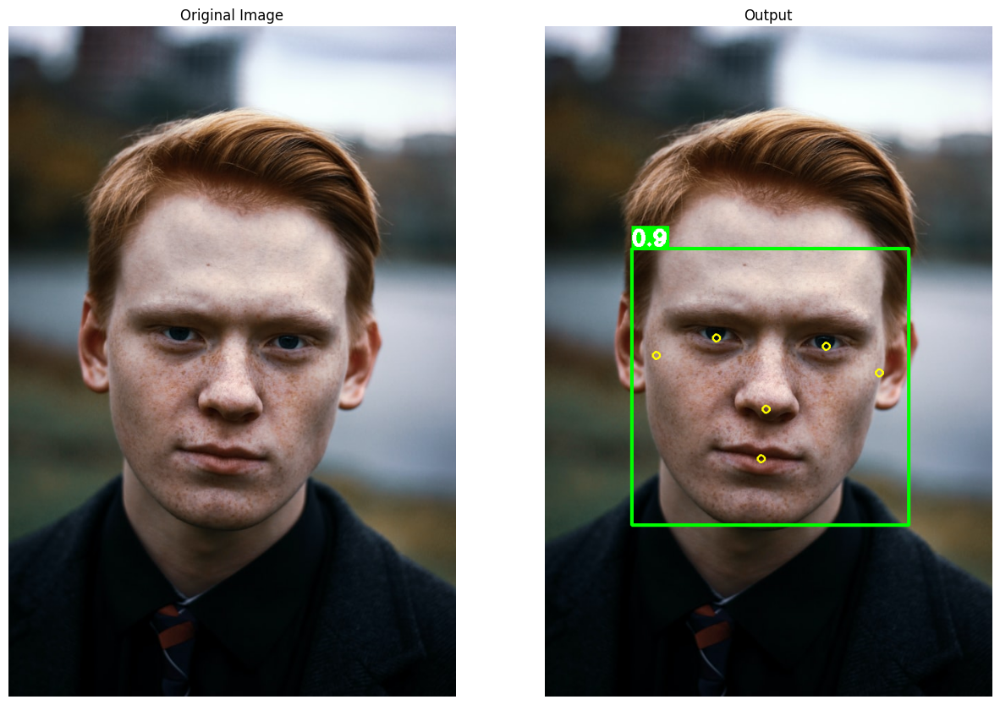

In [13]:
# Read a sample image and perform Mediapipe's face detection on it.
image = cv2.imread('media/sample1.jpg')
detectFaces(image, mp_face_detector, display=True)

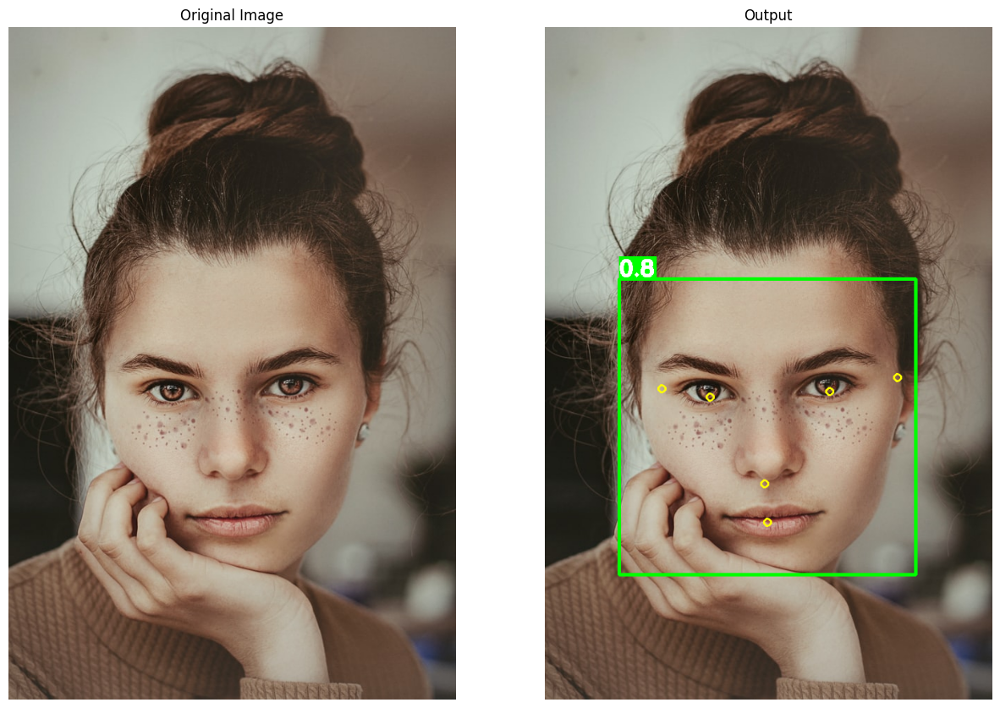

In [8]:
# Read another sample image and perform Mediapipe's face detection on it.
image = cv2.imread('media/sample2.jpg')
detectFaces(image, mp_face_detector, display=True)

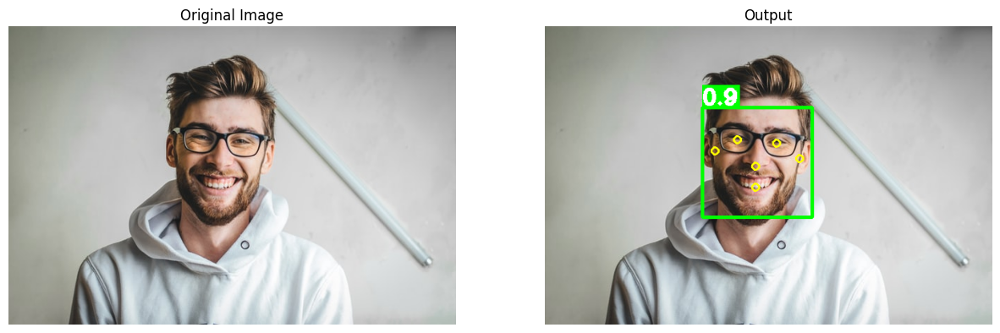

In [14]:
# Read another sample image and perform Mediapipe's face detection on it.
image = cv2.imread('media/sample3.jpg')
detectFaces(image, mp_face_detector, display=True)

Remarkable! the results are perfectly accurate.

## **<font style="color:rgb(134,19,348)">Initialize the Age and Gender Estimation Model</font>**

To perform the age and gender estimation, we will have to load [this CNN model](https://github.com/yu4u/age-gender-estimation) using the [**`tf.keras.models.load_model()`**](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function. The model is trained on [this IMDB-WIKI – 500k+ face dataset](https://data.vision.ee.ethz.ch/cvl/rrothe/imdb-wiki/).

In [15]:
# Load the trained age and gender estimation model.
age_gender_model = tf.keras.models.load_model(r'models/EfficientNetB3_224_weights.11-3.44.hdf5')

## **<font style="color:rgb(134,19,348)">Create a Age and Gender Estimation Function</font>**

Now that we have the model loaded, we will create a function **`predictAgeGender()`** that will utilize the loaded age and gender estimation model to perform inference on an image/frame after passing it through the required pre-processing steps.

In [16]:
def predictAgeGender(image, age_gender_model, draw=True, display=True):
    '''
    This function will predict the age and gender of person(s) in an image.
    Args:
        image:            The input image with person(s) whose age and gender needs to be estimated.
        age_gender_model: The loaded age and gender estimation model.
        draw:             A boolean value that is if set to true the function writes the predicted age and gender on the face image. 
        display:          A boolean value that is if set to true the function displays the face(s) image(s) with the 
                          predicted age and gender written (if draw was True) and returns nothing.
    Returns:
        faces_images: A list containing the cropped images of faces in the input image with the estimated age and gender written.
        predictions:  A list containing the predicted age and gender of the person(s) in the input image.
    '''
    
    # Perform Face Detection on the input image.
    image, detected_faces = detectFaces(image, mp_face_detector, draw=False, display=False)
    
    # Initialize a list to store the predicted age and gender of the faces in the image.
    predictions = []
    
    # Initialize a list to store the images of the detected faces.
    faces_images = []
    
    # Iterate over the found faces.
    for face_index, face in enumerate(detected_faces):
        
        # Get the face bounding box coordinates.
        x1, y1, x2, y2 = face
        
        # Crop the face region from the input image.
        face_roi = image[y1: y2, x1: x2].copy()
        
        # Resize the face image.
        face_roi_copy = cv2.resize(face_roi.copy(), (224, 224))
        
        # Convert the shape of the face image from (224, 224, 3) to (1, 224, 224, 3).
        face_roi_copy = np.expand_dims(face_roi_copy, axis=0)
        
        # Perform the age and gender prediction.
        predicted_results = age_gender_model.predict(face_roi_copy)
        
        # Get the predicted gender index value.
        predicted_gender_index = np.argmax(predicted_results[0])
        
        # Get the predicted gender name using the index value.
        predicted_gender = "Male" if predicted_gender_index == 1 else "Female"
        
        # Get the predicted age value.
        predicted_age = np.argmax(predicted_results[1])
        
        # Calculate a range in which the actual age is most-likely to lie in.
        age_range = (predicted_age-2, predicted_age+2)
        
        # Check if the predicted age and gender are specified to be written.
        if draw:
            
            # Write the predicted age range on the face image.
            cv2.putText(face_roi, text=f'Age: {age_range[0]} - {age_range[1]}', org=(10, 30), fontFace=cv2.FONT_HERSHEY_COMPLEX, 
                        fontScale=1, color=(255,255,255), thickness=2)
            
            # Write the predicted gender on the face image.
            cv2.putText(face_roi, text=f'Gender: {predicted_gender}', org=(10, 70), fontFace=cv2.FONT_HERSHEY_COMPLEX, 
                        fontScale=1, color=(255,255,255), thickness=2)
        
        # Append the face roi into the list.
        faces_images.append(face_roi)

        # Check if the face(s) image(s) is specified to be displayed.
        if display:
            
            # Display the face image.
            plt.figure(figsize=[10,10])
            plt.imshow(face_roi[:,:,::-1]);plt.title(f'Person {face_index+1} Image');plt.axis('off');
        
        # Otherwise.
        else:
            
            # Append the predicted age range and gender into the list.
            predictions.append((predicted_gender, age_range))
    
    # Check if the face(s) image(s) is not specified to be displayed.
    if not display:
        
        # Return the faces images with the predictions list.
        return faces_images, predictions

Now we will utilize the function **`predictAgeGender()`** created above to perform the age and gender estimation on a few sample images and visualize the results.

1/1 [==============================] - 13s 13s/step


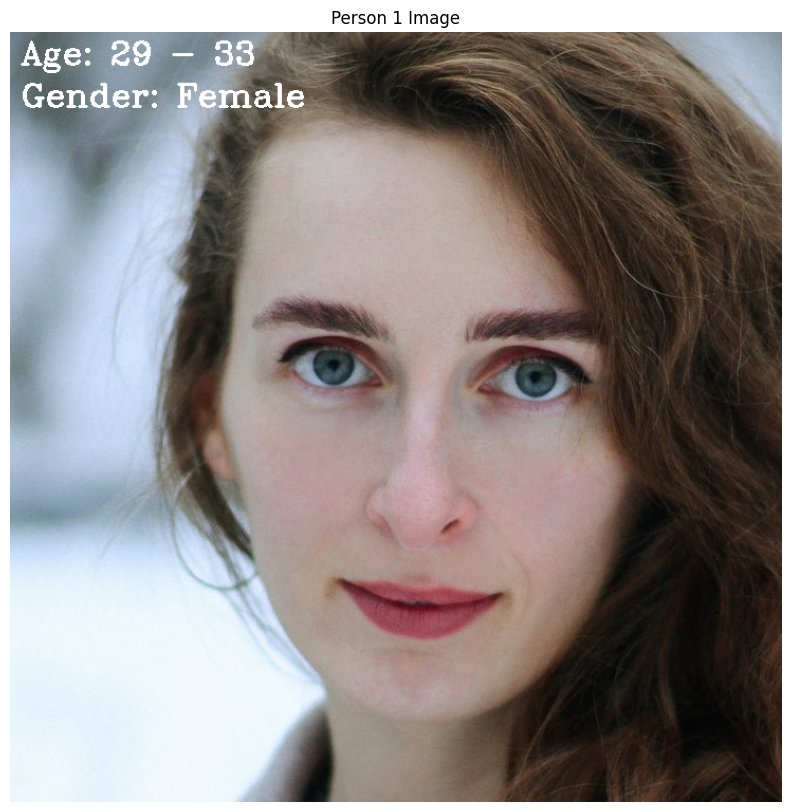

In [17]:
# Read a sample image and perform the age and gender estimation.
image = cv2.imread('media/sample4.jpg')
predictAgeGender(image, age_gender_model)

1/1 [==============================] - 1s 1s/step


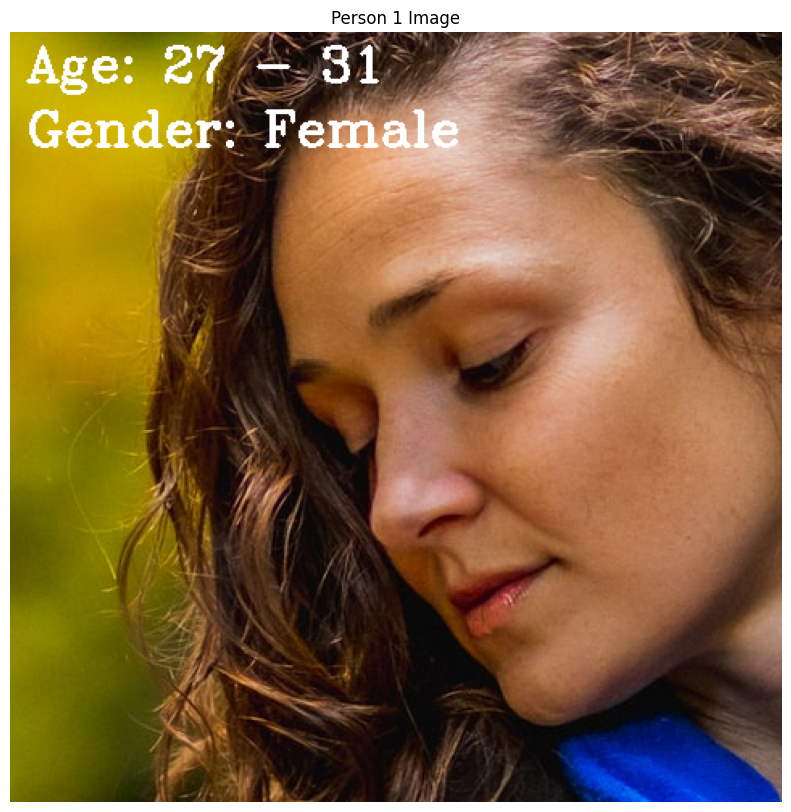

In [18]:
# Read another sample image and perform the age and gender estimation.
image = cv2.imread('media/sample5.jpg')
predictAgeGender(image, age_gender_model)

1/1 [==============================] - 0s 494ms/step


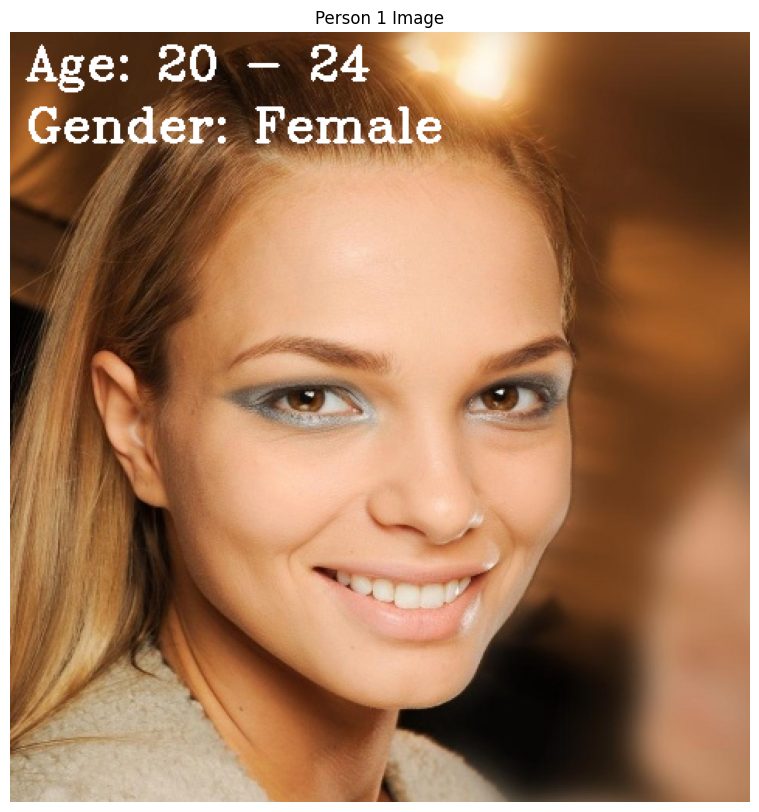

In [19]:
# Read another sample image and perform the age and gender estimation.
image = cv2.imread('media/sample6.jpg')
predictAgeGender(image, age_gender_model)

Working pretty well!

## **<font style="color:rgb(134,19,348)">Initialize the Race Prediction Model</font>**

Now moving on to the next one, again, we will first have to initialize the model, and we will be using a model provided by the famous [Deepface](https://github.com/serengil/deepface) framework. It is lightweight face recognition and facial attribute analysis (age, gender, emotion, and race) framework wrapping state-of-the-art models. To load the model we will use the function [**`DeepFace.build_model('Race')`**](https://github.com/serengil/deepface/blob/master/deepface/DeepFace.py#:~:text=def%20build_model(model_name)%3A-,%22%22%22,built,-deepface%20model).

In [20]:
# Build the deepface Race prediction model.
race_model = DeepFace.build_model('Race')

race_model_single_batch.h5 will be downloaded...


Downloading...
From: https://github.com/serengil/deepface_models/releases/download/v1.0/race_model_single_batch.h5
To: C:\Users\rahma\.deepface\weights\race_model_single_batch.h5
100%|██████████| 537M/537M [02:53<00:00, 3.10MB/s] 


## **<font style="color:rgb(134,19,348)">Create a Race Prediction Function</font>**

Now, we will create a function **`predictRace()`** that will utilize the model we have initialized, to perform the race prediction on an image/frame.

In [21]:
def predictRace(image_path, race_model, draw=True, display=True):
    '''
    This function will perform race prediction on an image.
    Args:
        image_path: The path of the image stored in the disk, on which the race prediction is required.
        race_model: The deepface race prediction model.
        draw:       A boolean value that is if set to true the function writes the predicted race on the image. 
        display:    A boolean value that is if set to true the function displays the image with the 
                    predicted race written (if draw was True) and returns nothing.
    Returns:
        image:          The input image with the predicted race written.
        predicted_race: The race name predicted by the model with the highest confidence.
        confidence:     The confidence value of the race that is predicted with the highest confidence.
    '''
    
    # Read the image.
    image = cv2.imread(image_path)
    
    # Perform Race prediction on the image.
    prediction = DeepFace.analyze(img_path = image_path, actions = ['race'], models = {'race': race_model},
                                  enforce_detection=False)
    
    # Get the race name predicted with the highest confidence.
    predicted_race = prediction['dominant_race']
    
    # Get the confidence value of the race.
    confidence = prediction['race'][predicted_race]
    
    # Check if the predicted race name is specified to be written.
    if draw:
    
        # Write the predicted race name on the image.
        cv2.putText(image, text=f'Race: {predicted_race}', org=(20, 80), fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=3,
                        color=(0,255,0), thickness=3)

    # Check if the image is specified to be displayed.
    if display:
        
        # Display the image.
        plt.figure(figsize=[10,10])
        plt.imshow(image[:,:,::-1]);plt.title(f'Output Image');plt.axis('off');

    # Otherwise.
    else:
        
        # Return the resultant image with the predicted race name and confidence.
        return image, (predicted_race, np.round(confidence, decimals=2))

Now let's see how this function **`predictRace()`** will perform on some images.

1/1 [==============================] - 13s 13s/step


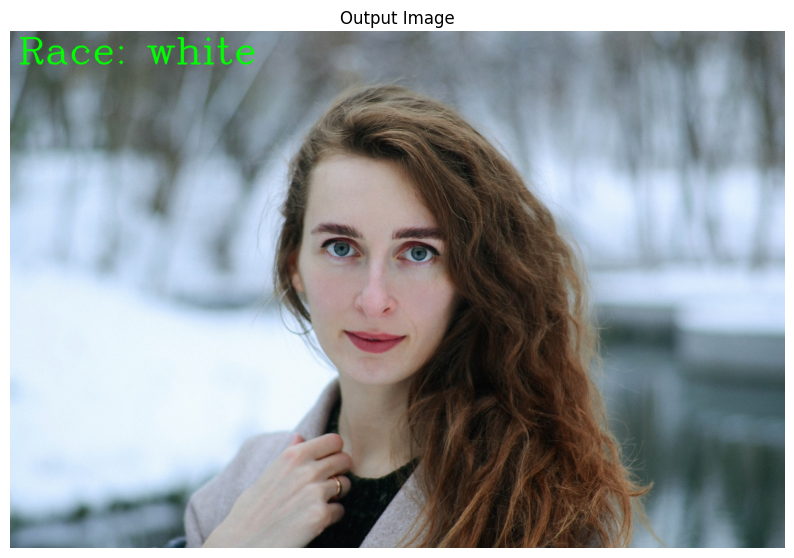

In [22]:
# Perform the race prediction on an image.
predictRace('media/sample4.jpg', race_model)

1/1 [==============================] - 11s 11s/step


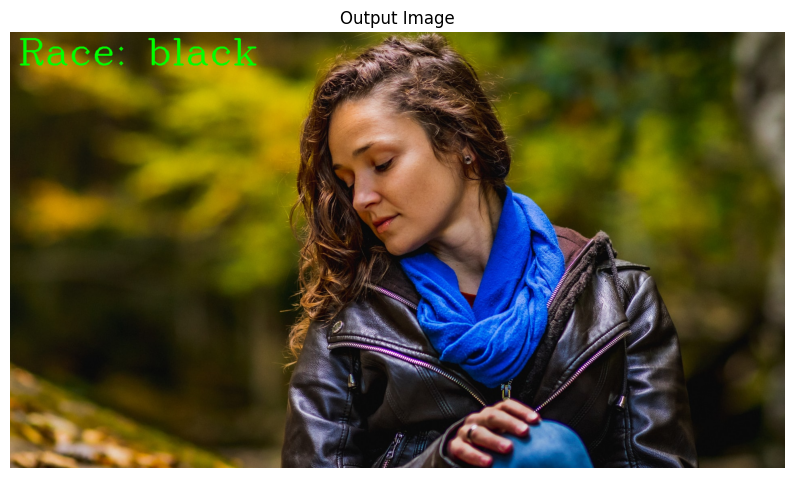

In [23]:
# Perform the race prediction on another image.
predictRace('media/sample5.jpg', race_model)

1/1 [==============================] - 4s 4s/step


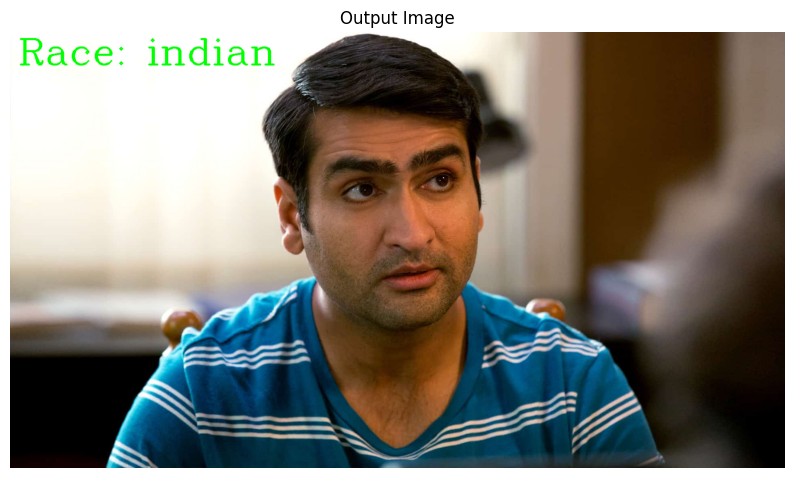

In [24]:
# Perform the race prediction on another image.
predictRace('media/sample16.jpg', race_model)

1/1 [==============================] - 9s 9s/step


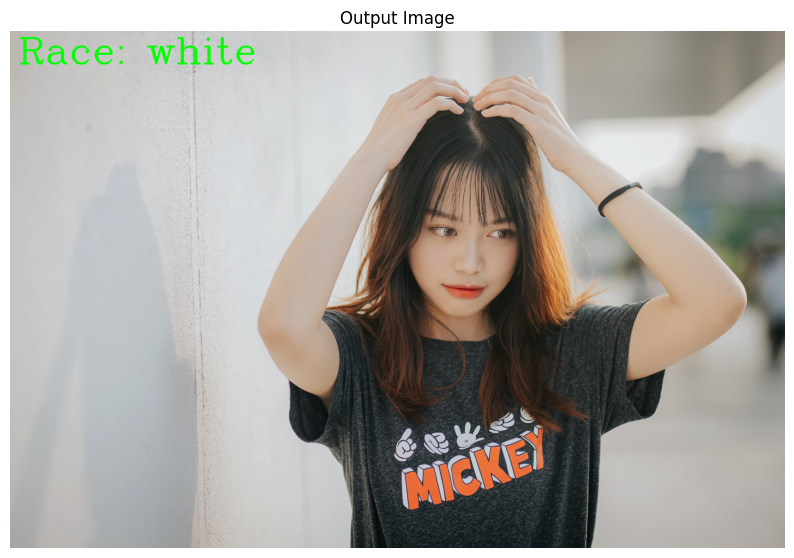

In [25]:
# Perform the race prediction on another image.
predictRace('media/sample17.jpg', race_model)

1/1 [==============================] - 4s 4s/step


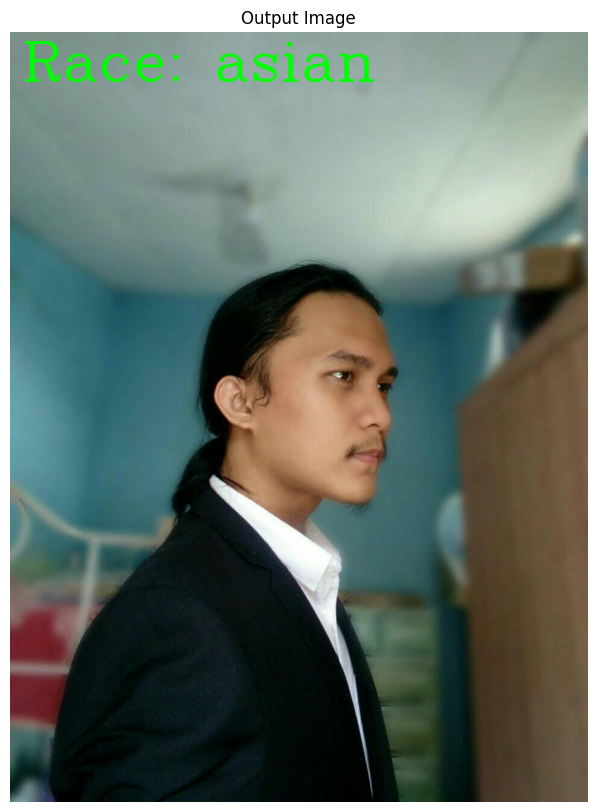

In [26]:
# Perform the race prediction on another image.
predictRace('media/profilePic.jpg', race_model)

Nice! Got the accurate results for this one too.

## **<font style="color:rgb(134,19,348)">Initialize the Hair Segmentation Model</font>**

To get the hair color, we will first need to get the location of the hair of the person in the image, and we will do it by utilizing [this hair segmentation model](https://github.com/thangtran480/hair-segmentation) trained on the [CelebAMask-HQ](https://github.com/switchablenorms/CelebAMask-HQ) dataset. To load this model stored in the disk, we will again use the [**`tf.keras.models.load_model()`**](https://www.tensorflow.org/api_docs/python/tf/keras/models/load_model) function. 

In [27]:
# Load the hair segmentation model.
hair_model = tf.keras.models.load_model(r'models/hairnet_matting_30.hdf5')

## **<font style="color:rgb(134,19,348)">Create a Hair Color Prediction Function</font>**

Now we will create a function **`getHairColor()`** that will utilize the hair segmentation model we just loaded, to get the hair mask (having pixel value 1 for the hair and 0 for the background) of the person in an image/frame and then get the hair color using the function [**`cv2.mean()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga191389f8a0e58180bb13a727782cd461).

In [28]:
def getHairColor(image, hair_model, threshold=0.8, debugging=False, draw=True, display=True):
    '''
    This function will extract the hair color of a person in an image using a hair segmentation model.
    Args:
        image:      The image of the person whose hair color needs to be extracted.
        hair_model: The loaded hair segmentation model.
        threshold:  A threshold value between 0 and 1 which will be used in creating a binary hair mask of the input image.
        debugging:  A boolean value that is if set to true the function displays the intermediate steps. 
        draw:       A boolean value that is if set to true the function draws a rectangle with the hair color on the image. 
        display:    A boolean value that is if set to true the function displays the image with the 
                    hair color rectangle drawn (if draw was True) and returns nothing.
    Returns:
        image:      The input image with the hair color rectangle drawn.
        hair_color: The extracted BGR color value of the hair of the person in the input image.
    '''
    
    # Initialize a variable to store the hair color.
    hair_color = None
    
    # Convert the image from BGR to RGB format.
    imageRGB = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2RGB)
    
    # Divide the image by 255 to convert it into range [0-1].
    imageRGB = imageRGB / 255
    
    # Resize the image.
    imageRGB = cv2.resize(imageRGB, (224, 224))
    
    # Convert the shape of the image from (224, 224, 3) to (1, 224, 224, 3).
    imageRGB = np.expand_dims(imageRGB, axis=0)
    
    # Perform hair segmentation on the image.
    prediction = hair_model.predict(imageRGB)
    
    # Convert the prediction from (1, 224, 224, 1) shape to (224, 224).
    hair_mask = prediction.reshape((224, 224))
    
    # Get a binary mask having pixel value 1 for the hair and 0 for the background.
    # Pixel values greater than the threshold value will become 1 and the remainings will become 0. 
    hair_mask = np.array(hair_mask > threshold, dtype=np.uint8)
    
    # Resize the hair mask to the orginal size of the image.
    hair_mask = cv2.resize(hair_mask, (image.shape[1], image.shape[0]))
    
    # Get the hair color by taking average (mean) of the hair area in the image.
    hair_color = cv2.mean(image, mask = hair_mask)[:3]
    
    # Check if the hair color is specified to be drawn.
    if draw:
        
        # Write the hair color on the image.
        cv2.putText(image, text=f'Hair Color:', org=(20, 50), fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=1.5,
                        color=(255,255,255), thickness=2)
        
        # Draw a filled rectangle with the hair color on the image.
        cv2.rectangle(image, pt1=(330, 20), pt2=(390, 60), 
                      color=(int(hair_color[0]), int(hair_color[1]), int(hair_color[2])), thickness=-1)

        # Draw an outline around the hair color rectangle with the white color on the image.
        cv2.rectangle(image, pt1=(330, 20), pt2=(390, 60), color=(255,255,255), thickness=2)
    
    # Check if the debugging is enabled.
    if debugging:
        
        # Display the hair mask.
        plt.figure(figsize=[5,5])
        plt.imshow(hair_mask, cmap='gray');plt.title(f'Hair Mask');plt.axis('off');

    # Check if the resultant image is specified to be displayed.
    if display:
        
        # Display the resultant image.
        plt.figure(figsize=[10,10])
        plt.imshow(image[:,:,::-1]);plt.title(f'Output Image');plt.axis('off');
    
    # Otherwise.
    else:
        
        # Return the resultant image with the hair color.
        return image, hair_color

Now, let’s test this **`getHairColor()`** function on a few sample images and display the results.

1/1 [==============================] - 3s 3s/step


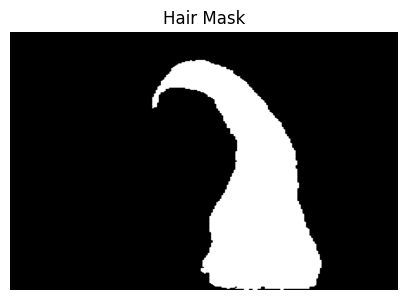

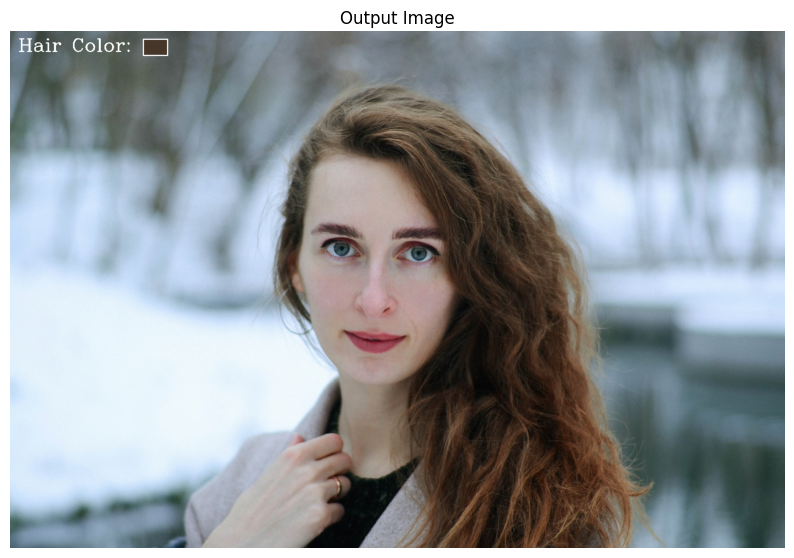

In [29]:
# Read a sample image and extract the hair color of the person in the image.
image = cv2.imread('media/sample4.jpg')
getHairColor(image, hair_model, debugging=True)

1/1 [==============================] - 0s 423ms/step


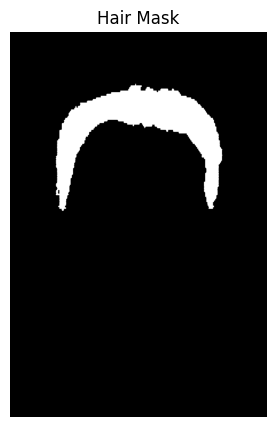

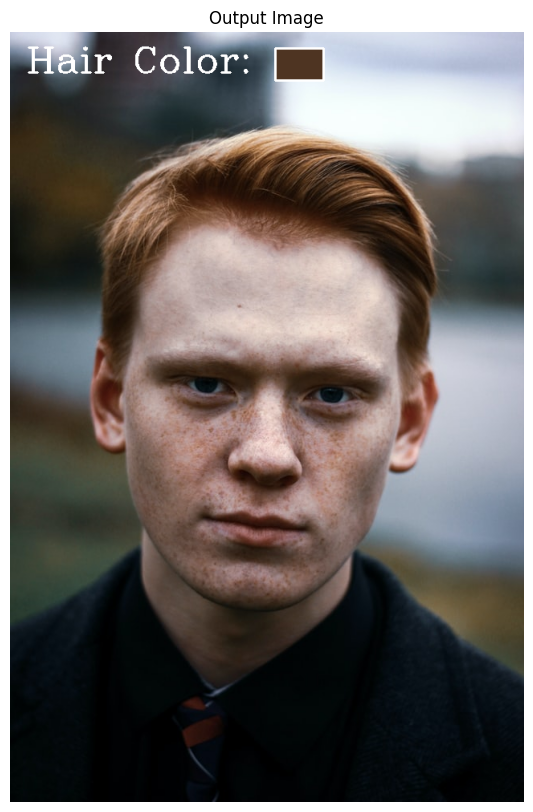

In [31]:
# Read another sample image and extract the hair color of the person in the image.
image = cv2.imread('media/sample1.jpg')
getHairColor(image, hair_model, debugging=True)

1/1 [==============================] - 0s 403ms/step


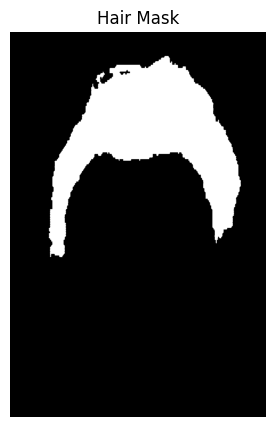

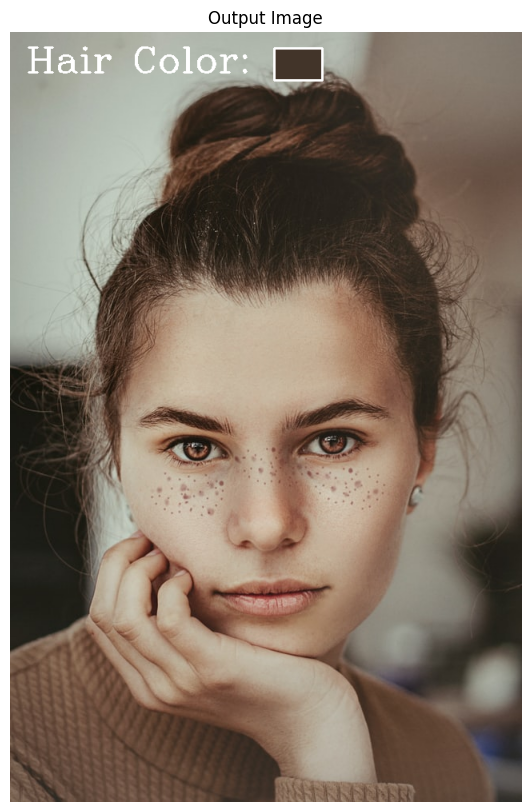

In [32]:
# Read another sample image and extract the hair color of the person in the image.
image = cv2.imread('media/sample2.jpg')
getHairColor(image, hair_model, debugging=True)

1/1 [==============================] - 0s 454ms/step


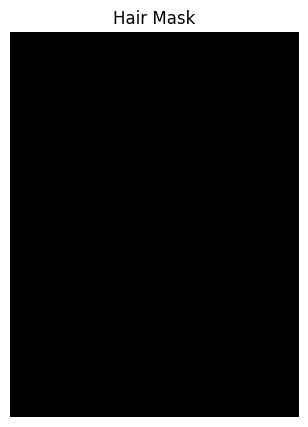

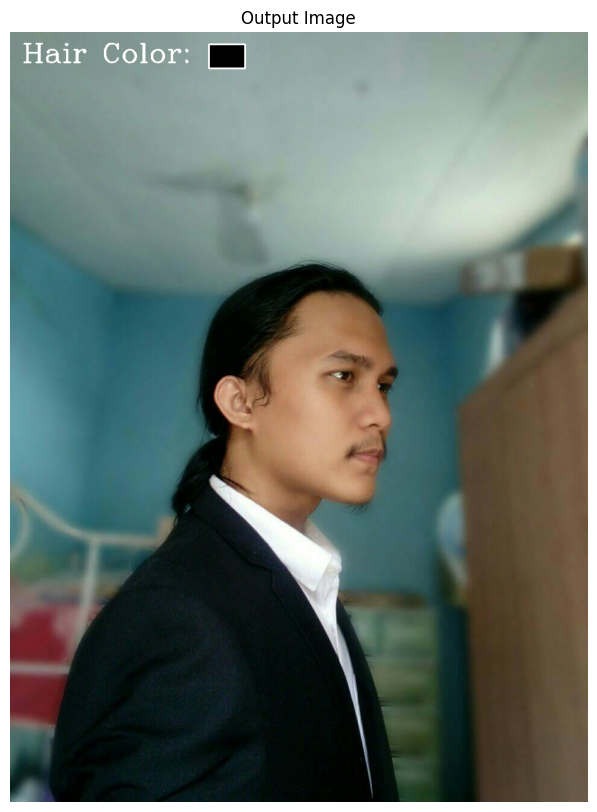

In [39]:
# Read another sample image and extract the hair color of the person in the image.
image = cv2.imread('media/profilePic.jpg')
getHairColor(image, hair_model, debugging=True)



# Additional comments:
#       - My hair wasn't segmented. However, the hair color
#         was detected.

Stunning! Now, let’s move to the last one.

## **<font style="color:rgb(134,19,348)">Initialize the Face Landmarks Detection Model</font>**

Now we will initialize the **`mp.solutions.face_mesh`** class and set up the **`mp.solutions.face_mesh.FaceMesh()`** function (for videos) with appropriate arguments as we have been doing in the previous lessons.

In [33]:
# Initialize the mediapipe face mesh class.
mp_face_mesh = mp.solutions.face_mesh

# Setup the face mesh function with appropriate arguments.
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=True,
                                  min_detection_confidence=0.8, min_tracking_confidence=0.5)

## **<font style="color:rgb(134,19,348)">Create an Eye Iris Landmarks Function</font>**

Now we will create a function **`detectIris()`** that will take in a cropped image of an eye region and will utilize the [Mediapipe's Iris Solution](https://google.github.io/mediapipe/solutions/iris) to determine the iris landmarks (along the iris contour).

**Note that** *the Mediapipe's Iris Solution is not directly usable in python, so we will download the [.tflite model](https://github.com/google/mediapipe/tree/master/mediapipe/modules/iris_landmark) used in Mediapipe's Iris Solution and perform inference on it using [TensorFlow Lite](https://www.tensorflow.org/lite/guide/inference#load_and_run_a_model_in_python).* 

In [35]:
def detectIris(eye_image, is_right_eye=False):
    '''
    This function will detect iris landmarks on an eye image.
    Args:
        eye_image:    A cropped image of the eye whose iris landmarks needs to be detected.
        is_right_eye: A boolean value that is True if the eye whose iris landmarks needs to be
                      detected, is the right eye.
    Retuns:
        iris_landmarks: An array containing the normalized (x, y, z) coordinates of the detected iris landmarks.
    '''
    
    # Create a helper function to perform inference.
    def tflite_inference(inputs, model_path):
        '''
        This function will perform iris landmarks inference on an eye image.
        Args:
            inputs:     A cropped image of the eye whose iris landmarks needs to be detected.
            model_path: The path where the .tflite model is stored in the disk.
        Returns:
            outputs: A list containing the output of the model.
        '''
        
        # Check if the input is not a list of a tuple.
        if not isinstance(inputs, (list, tuple)):
            
            # Convert it into a tuple.
            inputs = (inputs,)

        # Load the TFLite model and allocate tensors.
        interpreter = tf.lite.Interpreter(model_path=model_path)
        interpreter.allocate_tensors()

        # Get the input and output tensors details.
        input_details = interpreter.get_input_details()
        output_details = interpreter.get_output_details()

        # Set the value of the input tensor.
        for inp, inp_det in zip(inputs, input_details):
            interpreter.set_tensor(inp_det["index"], np.array(inp[None, ...], dtype=np.float32))
        
        # Invoke the interpreter.
        interpreter.invoke()

        # Get the value of the output tensor.
        outputs = [interpreter.get_tensor(out["index"]) for out in output_details]
        
        # Return the output tensor.
        return outputs
    
    # Specify the path where the .tflite model is stored in the disk.
    model_path = "models/iris_landmark.tflite"
    
    # Convert the image from BGR into RGB format.
    eye_imageRGB = cv2.cvtColor(eye_image, cv2.COLOR_BGR2RGB)
    
    # Resize the image.
    eye_imageRGB = cv2.resize(eye_imageRGB, (64, 64), interpolation=cv2.INTER_AREA)
    
    # Check if this is a right eye.
    if is_right_eye:
        
        # Flip the image horizontally.
        eye_imageRGB = np.fliplr(eye_imageRGB)
    
    # Perform iris landmarks inference on the eye image.
    outputs = tflite_inference(eye_imageRGB/255, model_path)
    
    # Get the iris landmarks from the output.
    iris_landmarks = np.reshape(outputs[1], (5, 3))
    
    # Normalize the landmarks.
    iris_landmarks = iris_landmarks / eye_imageRGB.shape[0]
    
    # Check if this is a right eye.
    if is_right_eye:
        
        # Subtract the landmarks from 1.
        iris_landmarks[:, 0] = 1 - iris_landmarks[:, 0]
       
    # Return the normalized landmarks.
    return iris_landmarks

Now moving on to the eye color part, we will create a function **`getEyesColor()`**, that will utilize the function  **`detectFacialLandmarks()`** (from a previous lesson) to detect the facial landmarks and then use the frozenset objects (**`mp_face_mesh.FACEMESH_LEFT_EYE`** and **`mp_face_mesh.FACEMESH_RIGHT_EYE`**) to isolate the eyes landmarks. And then utilize the eyes landmarks to crop the left and right eye regions of the person in the image/frame and pass those eyes regions to the **`detectIris()`** function created above. 

After detecting the iris landmarks, we will find the center of the iris of the eyes using the function [**`numpy.mean()`**](https://numpy.org/doc/stable/reference/generated/numpy.mean.html) and then again use the [**`cv2.mean()`**](https://docs.opencv.org/4.x/d2/de8/group__core__array.html#ga191389f8a0e58180bb13a727782cd461) function to get the eyes color.

In [36]:
def getEyesColor(image, face_mesh, debugging=False, draw=True, display=True):
    '''
    This function will extract the eyes color of a person in an image using the face and iris landmarks detection.
    Args:
        image:     The image of the person whose eye color needs to be extracted.
        face_mesh: The Mediapipe's face landmarks detection function required to perform the landmarks detection.
        debugging: A boolean value that is if set to true the function displays the intermediate steps. 
        draw:      A boolean value that is if set to true the function draws a rectangle with the eyes color on the image. 
        display:   A boolean value that is if set to true the function displays the image with the 
                   eyes color rectangle drawn (if draw was True) and returns nothing.
    Returns:
        image:     The input image with the eyes color rectangle drawn.
        eye_color: The extracted BGR color value of the eyes of the person in the input image.
    '''
    
    # Initialize a variable to store the eyes color. 
    eye_color = None
    
    # Retrieve the height and width of the image.
    image_height, image_width, _ = image.shape
    
    # Perform Face landmarks detection.
    image, face_landmarks = detectFacialLandmarks(image, face_mesh, draw=False, display=False)
    
    # Check if the Face landmarks in the image are detected.
    if len(face_landmarks)>0:
        
        # Get the indexes of the landmarks of the eyes into a list.
        # Also convert it into a set, to remove the duplicate indexes.
        LEFT_EYE_INDEXES= set(list(itertools.chain(*mp_face_mesh.FACEMESH_LEFT_EYE)))
        RIGHT_EYE_INDEXES = set(list(itertools.chain(*mp_face_mesh.FACEMESH_RIGHT_EYE)))
        
        # Initialize lists to store the left and right eye landmarks.
        left_eye_landmarks = []
        right_eye_landmarks = []
        
        # Iterate over the indexes of the landmarks of the left eye. 
        for INDEX in LEFT_EYE_INDEXES:
            
            # Append the landmark into the list.
            left_eye_landmarks.append(face_landmarks[INDEX])
            
        # Iterate over the indexes of the landmarks of the right eye. 
        for INDEX in RIGHT_EYE_INDEXES:
            
            # Append the landmark into the list.
            right_eye_landmarks.append(face_landmarks[INDEX])
        
        # Get the coordinates of the bounding boxes around the left and right eye.
        left_eye_x1, left_eye_y1, left_eye_width, left_eye_height = cv2.boundingRect(np.array(left_eye_landmarks))
        right_eye_x1, right_eye_y1, right_eye_width, right_eye_height = cv2.boundingRect(np.array(right_eye_landmarks))
        
        # Calculate the lower right corner coordinates of the bounding boxes.
        left_eye_x2, left_eye_y2 = left_eye_x1+left_eye_width, left_eye_y1+left_eye_height
        right_eye_x2, right_eye_y2 = right_eye_x1+right_eye_width, right_eye_y1+right_eye_height
        
        # Create a copy of the input image.
        eyes_rects_image = image.copy()
        
        # Draw the bounding boxes around the left and right eye.
        cv2.rectangle(eyes_rects_image, pt1=(left_eye_x1,left_eye_y1), pt2=(left_eye_x2, left_eye_y2), color=(0,255,0), thickness=2)
        cv2.rectangle(eyes_rects_image, pt1=(right_eye_x1,right_eye_y1), pt2=(right_eye_x2, right_eye_y2), color=(0,255,0), thickness=2)
        
        # Check if the debugging is enabled.
        if debugging:
            
            # Display the resultant image with the eyes bounding boxes drawn.
            plt.figure(figsize=[5,5])
            plt.imshow(eyes_rects_image[:,:,::-1]);plt.title(f'Eyes Rectangles');plt.axis('off');
        
        # Specify the margin amount for the bounding boxes.
        margin = 10
        
        # Add margin to the bounding boxes around the left and right eye.
        left_eye_x1, left_eye_y1, left_eye_x2, left_eye_y2 = left_eye_x1-margin, left_eye_y1-margin, left_eye_x2+margin, left_eye_y2+margin
        right_eye_x1, right_eye_y1, right_eye_x2, right_eye_y2 = right_eye_x1-margin, right_eye_y1-margin, right_eye_x2+margin, right_eye_y2+margin
        
        # Crop the left and right eye regions from the image.
        left_eye_roi = image[left_eye_y1: left_eye_y2, left_eye_x1: left_eye_x2].copy()
        right_eye_roi = image[right_eye_y1: right_eye_y2, right_eye_x1: right_eye_x2].copy()
        
        # Check if the debugging is enabled.
        if debugging:
              
            # Display the left and right eye cropped regions.
            plt.figure(figsize=[5,5])
            plt.subplot(121);plt.imshow(left_eye_roi[:,:,::-1]);plt.title(f'Left Eye ROI');plt.axis('off');
            plt.subplot(122);plt.imshow(right_eye_roi[:,:,::-1]);plt.title(f'Right Eye ROI');plt.axis('off');
        
        # Get the left and right eye iris landmarks.
        left_iris_landmarks = detectIris(left_eye_roi, is_right_eye=False)
        right_iris_landmarks = detectIris(right_eye_roi, is_right_eye=True)
        
        # Scale back the iris landmarks according to the size of left and right eye cropped images.
        left_iris_landmarks = (np.array((left_eye_roi.shape[1], left_eye_roi.shape[0])) * left_iris_landmarks[:,:2]).astype(np.int32)
        right_iris_landmarks = (np.array((right_eye_roi.shape[1], right_eye_roi.shape[0])) * right_iris_landmarks[:,:2]).astype(np.int32)
        
        # Get the landmarks position according to the original input image.
        left_iris_landmarks +=  left_eye_x1, left_eye_y1
        right_iris_landmarks +=  right_eye_x1, right_eye_y1
        
        # Create a copy of the input image.
        iris_image = image.copy()
        
        # Get the center of the left and right iris. 
        left_eye_iris_center = left_iris_landmarks.mean(axis=0).astype(np.int32)
        right_eye_iris_center  = right_iris_landmarks.mean(axis=0).astype(np.int32)
        
        # Create a black mask image.
        iris_mask = np.zeros(image.shape[:2], np.uint8)
        
        # Draw white circles on the mask image at the left and right iris center.
        cv2.circle(iris_mask, center=left_eye_iris_center,radius=left_eye_height//3, color=(255, 255, 255), thickness=-1)
        cv2.circle(iris_mask, center=right_eye_iris_center, radius=right_eye_height//3, color=(255, 255, 255), thickness=-1)
        
        # Draw green circles on the copy of input image at the left and right iris center.
        cv2.circle(iris_image, center=left_eye_iris_center, radius=left_eye_height//3, color=(0, 255, 0), thickness=-1)
        cv2.circle(iris_image, center=right_eye_iris_center, radius=right_eye_height//3, color=(0, 255, 0), thickness=-1)
        
        # Check if the debugging is enabled.
        if debugging:
            
            # Display the resultant image with the circles at eyes iris drawn.
            plt.figure(figsize=[10,10])
            plt.subplot(121);plt.imshow(iris_mask, cmap='gray');plt.title(f'Iris Mask');plt.axis('off');
            plt.subplot(122);plt.imshow(iris_image[:,:,::-1]);plt.title(f'Eyes ROI');plt.axis('off');
           
        # Get the eyes color by taking average (mean) of the eyes area in the image.
        eye_color = cv2.mean(image, mask=iris_mask)[:3]
        
        # Check if the eyes color is specified to be drawn.
        if draw:
            
            # Write the eyes color on the image.
            cv2.putText(image, text=f'Eyes Color:', org=(20, 50), fontFace=cv2.FONT_HERSHEY_COMPLEX, fontScale=1.5,
                        color=(255,255,255), thickness=2)
            
            # Draw a filled rectangle with the eyes color on the image.
            cv2.rectangle(image, pt1=(330, 20), pt2=(390, 60), 
                      color=(int(eye_color[0]), int(eye_color[1]), int(eye_color[2])), thickness=-1)
            
            # Draw an outline around the eyes color rectangle with the white color on the image.
            cv2.rectangle(image, pt1=(330, 20), pt2=(390, 60), color=(255,255,255), thickness=2)

    # Check if the resultant image is specified to be displayed.
    if display:
        
        # Display the resultant image.
        plt.figure(figsize=[10,10])
        plt.imshow(image[:,:,::-1]);plt.title(f'Output Image');plt.axis('off');
    
    # Otherwise.
    else:
        
        # Return the resultant image with the eye color.
        return image, eye_color

Now, as done for every other function, we will test the function **`getEyesColor()`** created above, on a few sample images.

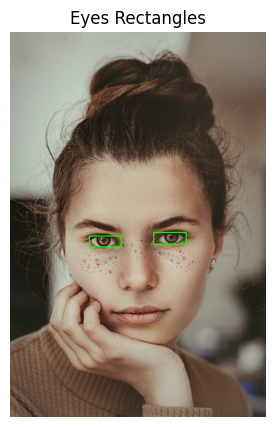

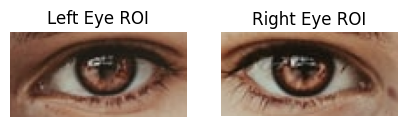

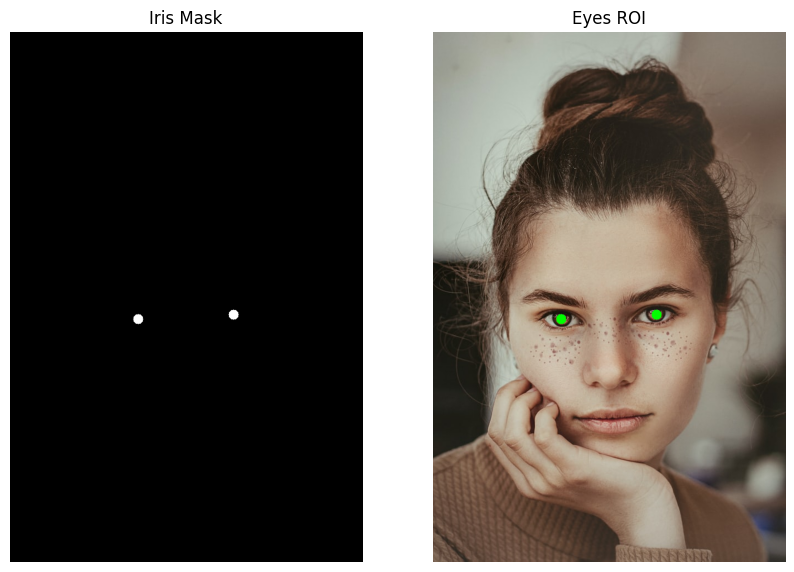

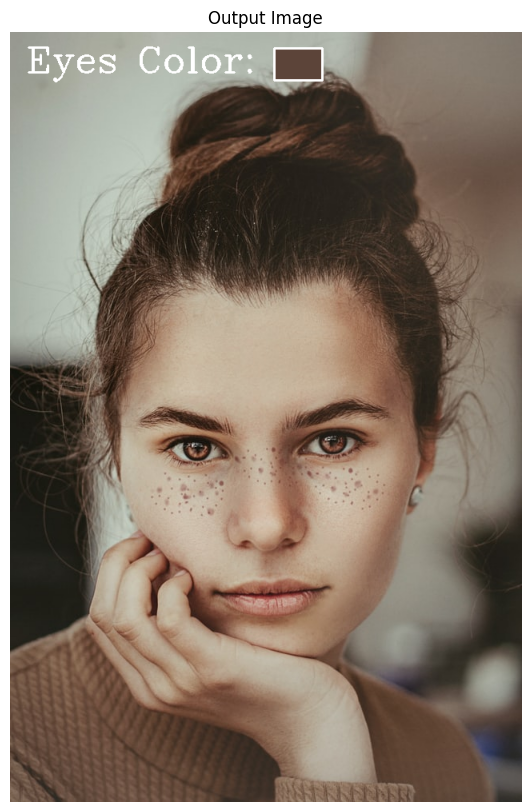

In [37]:
# Read a sample image and extract the eyes color of the person in the image.
image = cv2.imread('media/sample2.jpg')
getEyesColor(image, face_mesh, debugging=True)

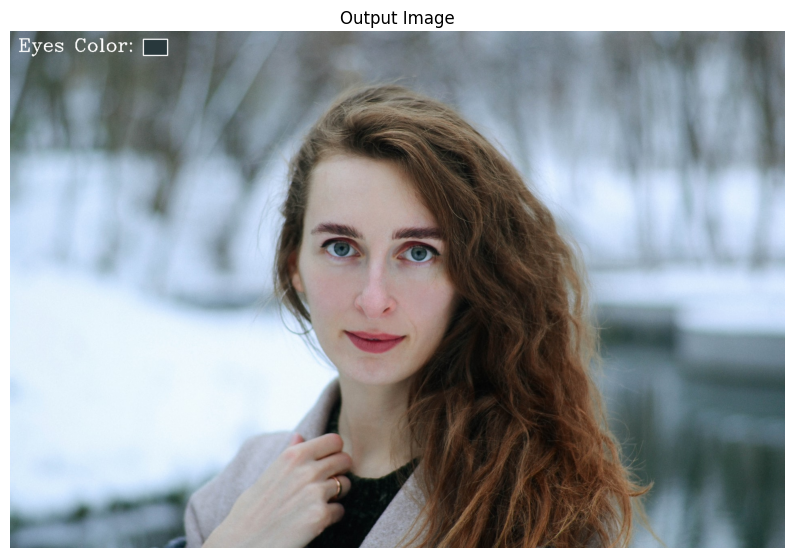

In [40]:
# Read another sample image and extract the eyes color of the person in the image.
image = cv2.imread('media/sample4.jpg')
getEyesColor(image, face_mesh, debugging=False)

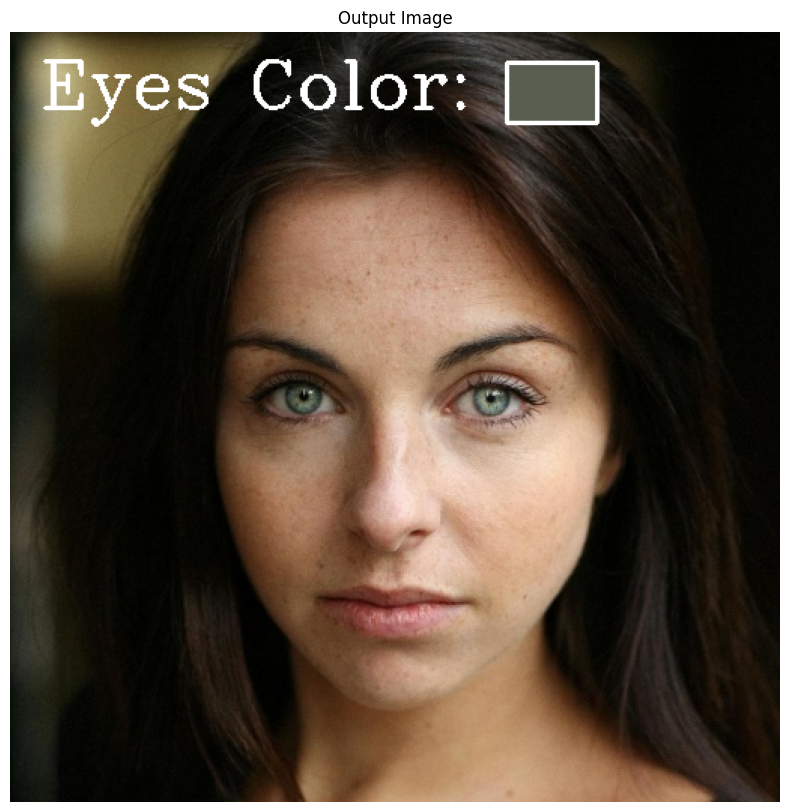

In [41]:
# Read another sample image and extract the eyes color of the person in the image.
image = cv2.imread('media/sample9.jpg')
getEyesColor(image, face_mesh, debugging=False)

Cool! again got accurate results.

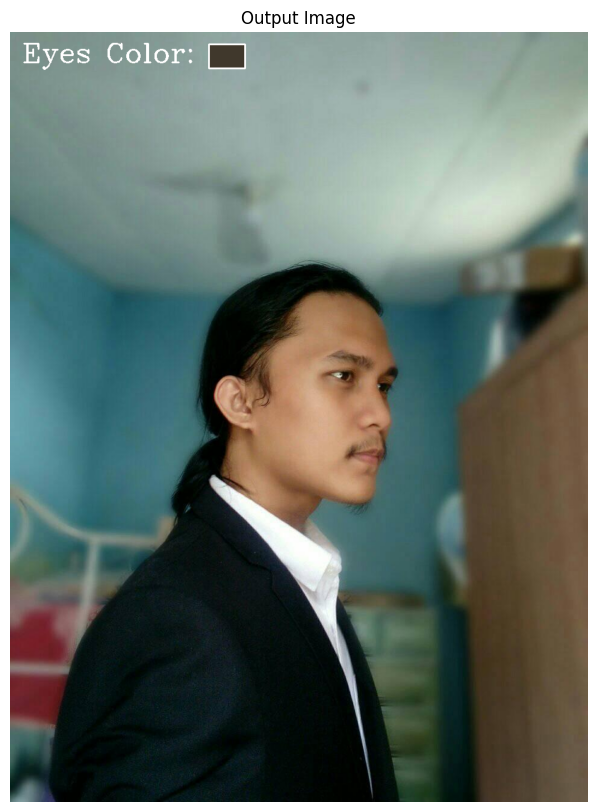

In [42]:
# Read another sample image and extract the eyes color of the person in the image.
image = cv2.imread('media/profilePic.jpg')
getEyesColor(image, face_mesh, debugging=False)


# Additional comment:
#       - My mean eye color is some kind of a brownish grayish color

### **<font style="color:rgb(255,140,0)"> Code License Agreement </font>**
```
Copyright (c) 2022 Bleedai.com

Feel free to use this code for your own projects commercial or noncommercial, these projects can be Research-based, just for fun, for-profit, or even Education with the exception that you’re not going to use it for developing a course, book, guide, or any other educational products.

Under *NO CONDITION OR CIRCUMSTANCE* you may use this code for your own paid educational or self-promotional ventures without written consent from Taha Anwar (BleedAI.com).

```



